# Web-Scraping News entries from a local website.

## Objetive:
- To create a collection of news articles by municipality for later clasification, analysis and extraction of new variables (e.g. up-to-date homicide count, violence asociated to organized crime, stakeholders mapping, and public policy action of local goverments for the sake of acountability)
- A database like this will allow companies to perform social risk anlysis in a expedited way before undertaking new ventures
- From a social poitn of view, this database could help track the evolution of salient social issues like public policy responsiveness and violence. 

## Steps:

###  1.- Finding the source: This is, a website that contains historical archives, and that allows an easy scraping process.

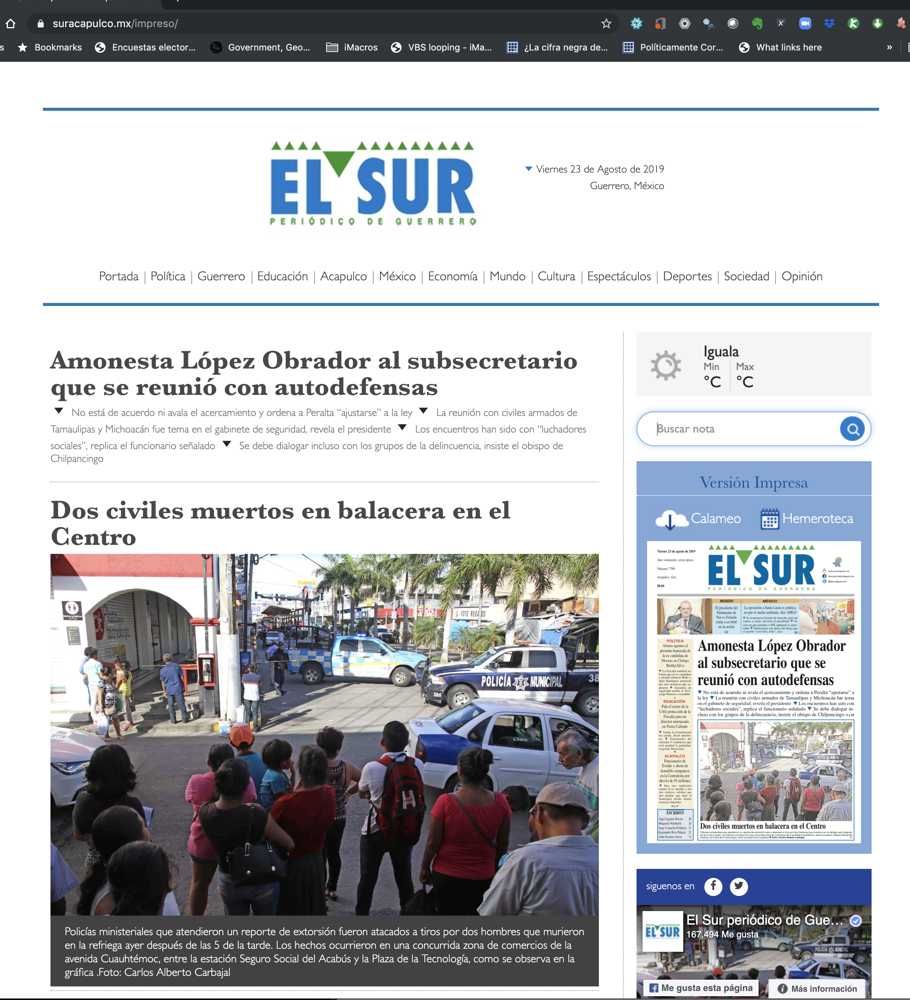

###  2.- Analizing the structure of the website: This, to detect the elements needed to build the proces and the  database. 
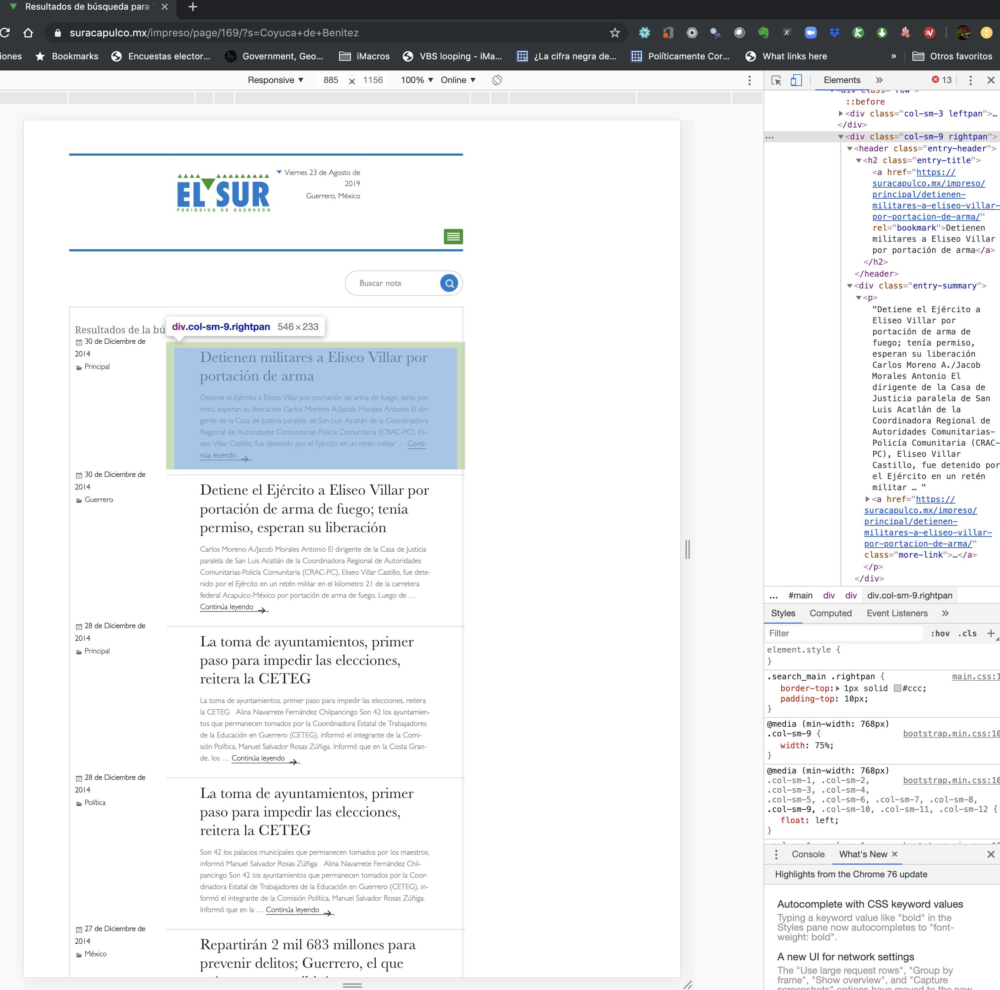

###  3.- Time to code!

In [1]:
# Loading necesary libraries
from splinter import Browser
from splinter.exceptions import ElementDoesNotExist
from bs4 import BeautifulSoup
import pymongo
import os
import pandas as pd
import re
import datetime
import time
import json

In [2]:
# Conecting to MongoDB to store final data base
conn = 'mongodb://localhost:27017'
client = pymongo.MongoClient(conn)
db = client.News_db
collection0 = db.Lista_Notas
collection1 = db.Notas_txt

In [89]:
## Loading the catalog of municipalities and select just those names from Gerrero state using Inegi index
#
municipios=pd.read_csv("CatalogoMunicipios.csv", delimiter=",", encoding='utf-8')
municipios=municipios[municipios.Cve_Ent==12].reset_index()

In [4]:
## Create arrays where data is gointg to be collected
head=[]
link=[]
resumen=[]
fecha=[]
municipio=[]

In [5]:
# open browser to iniciate the scraping proces
executable_path = {'executable_path': 'chromedriver.exe'}
browser = Browser('chrome', **executable_path, headless=False)

###  ¿How to crawl through?

In [6]:
#Scraping process
#1.-
# Loop through municipalities and through the search result pages
t=0
for mun in municipios.Nom_Mun:

    url0='https://suracapulco.mx/impreso/?s='
    url1=url0+mun
    browser.visit(url1)
    time.sleep(5)
    html = browser.html
    soup = BeautifulSoup(html, 'html.parser')
    page=soup.find_all('div', class_='nav-links')
    nPages=pd.DataFrame(pd.to_numeric(page[0].text.split(), errors='coerce')).max()
    if(int(nPages)>50):
        nPages=50
    url0='https://suracapulco.mx/impreso/page/'
    
    for pg in range(1,(int(nPages)+1)):
            url_l=url0+str(pg)+"/?s="+mun
            browser.visit(url_l)
            time.sleep(1.5)
            html = browser.html
            soup = BeautifulSoup(html, 'html.parser')
            Notas= soup.find_all('div', class_='search_main')
            for nota in Notas:
                t=t+1
                if nota.find('a')['href'] is None: link.append("") 
                else: link.append(nota.find('a')['href'])
                if nota.find('time')['datetime'] is None: fecha.append("")  
                else: fecha.append(nota.find('time')['datetime'][:10])
                if nota.find('h2') is None: head.append("") 
                else: head.append(nota.find('h2').text.strip())
                if nota.find('p') is None: resumen.append("") 
                else: resumen.append(nota.find('p').text.strip())
                municipio.append(mun)
                if (t<5): print(f"n.{t}:------------\nFecha: {nota.find('time')['datetime'][:10]}\nHeader: {nota.find('h2').text.strip()}")

n.1:------------
Fecha: 2004-02-02
Header: Ingeniero Orlando Soberanis Vargas, director de Obras Públicas del Municipio de Acapulco de Juárez Insiste José Sánchez en que la huelga de hambre de los presos de Aguas Blancas era una farsa
n.2:------------
Fecha: 2004-02-02
Header: Ingeniero Orlando Soberanis Vargas, director de Obras Públicas del Municipio de Acapulco de Juárez Insiste José Sánchez en que la huelga de hambre de los presos de Aguas Blancas era una farsa
n.3:------------
Fecha: 2019-03-09
Header: La delincuencia no ha bajado en Cancún y Juárez, admite AMLO; en Tijuana y Acapulco sí mejoran
n.4:------------
Fecha: 2018-09-08
Header: Bloquean vecinos de la Benito Juárez la calzada Acapulco-México para exigir potable


In [7]:
#Create dataframe to obtaun unike articles weblinks
Notas_df=pd.DataFrame({'link':link, 'fecha':fecha, 'municipio':municipio, 'header':head, 'resumen':resumen})
Notas_df.fecha=pd.to_datetime(Notas_df.fecha, format='%Y-%m-%d')
Notas_df.to_csv("DB_News.csv")
df=Notas_df[["link", "fecha", "header", "resumen"]]
df.drop_duplicates(subset ="link", keep = 'first', inplace = True)

C:\Users\gutie\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [78]:
#Load data to mongo DB
records = json.loads(Notas_df.to_json(orient='records'))
collection0.insert_many(records, ordered=False)

In [9]:
#Query data
post = db.Lista_Notas.find()
t=0
for pt in post:
   t=t+1
   if(t<15): print(pt)

{'_id': ObjectId('5d5f6dc989c583233b089d9b'), 'link': 'https://suracapulco.mx/impreso/cartas/ingeniero-orlando-soberanis-vargas-director-de-obras-publicas-del-municipio-de-acapulco-de-juarez-insiste-jose-sanchez-en-que-la-huelga-de-hambre-de-los-presos-de-aguas-blancas-era-una-farsa-2/', 'fecha': 1075680000000, 'municipio': 'Acapulco de Juárez', 'header': 'Ingeniero Orlando Soberanis Vargas, director de Obras Públicas del Municipio de Acapulco de Juárez Insiste José Sánchez en que la huelga de hambre de los presos de Aguas Blancas era una farsa', 'resumen': 'Señor director: Por medio de la presente me permito solicitar hacer uso del derecho de réplica por alusión a la nota publicada en su prestigiado diario el pasado fin de semana en la que se refiere a mi persona que dice: “Levantan su ayuno familiares de los presos de Aguas Blancas”. Sólo contestarle al … Continúa leyendo Ingeniero Orlando Soberanis Vargas, director de Obras Públicas del Municipio de Acapulco de Juárez Insiste José S

## Checking the results!
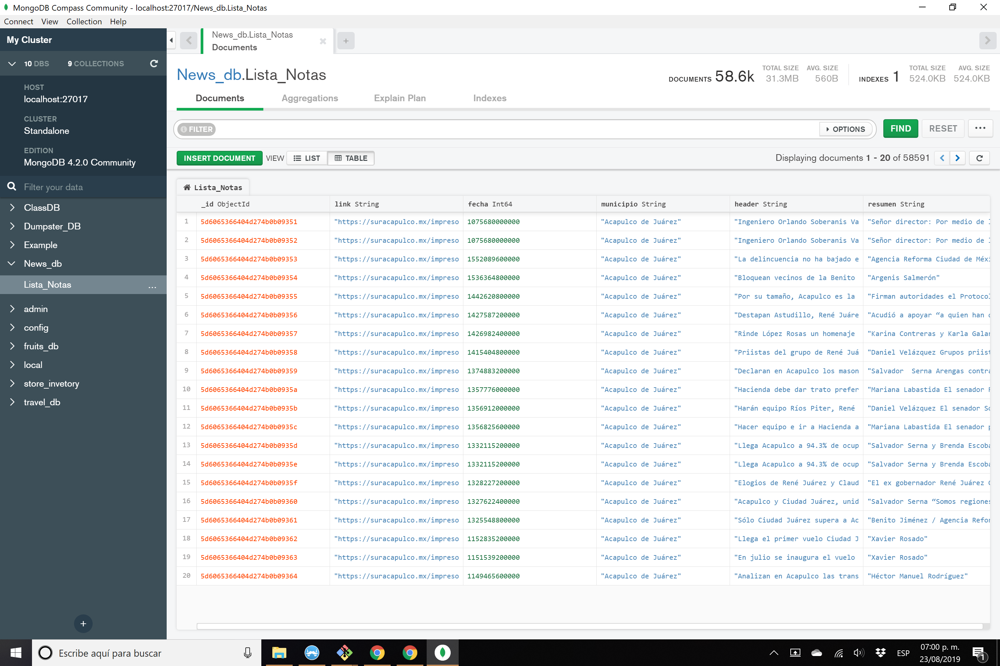

In [58]:
# Scrape through each weblink to obtain complete text of each article
nota=[]
link_id=[]
t=0

In [77]:
print(t)
len(df.link)

4914


35369

In [75]:

for nt in df.link[4449:]:
    t=t+1
    browser.visit(nt)
    time.sleep(1)
    html = browser.html
    soup = BeautifulSoup(html, 'html.parser')
    try: NT=soup.find('div', class_="details-content").text
    except AttributeError: 
        time.sleep(5)
        html = browser.html
        soup = BeautifulSoup(html, 'html.parser')
    try: NT=soup.find('div', class_="details-content").text
    except AttributeError:
        nota.append("")
    NT=soup.find('div', class_="details-content").text
    if soup.find('div', class_="details-content").text is None: nota.append("")
    else: nota.append(NT)
    if soup.find('div', class_="details-content").text is None: link_id.append(nt)
    else: link_id.append(nt)
    if(t<4453): print(f'{t}:-----------------')
    if(t<4453): print(f'link: {nt} \nNota: {NT}')


4450:-----------------
link: https://suracapulco.mx/impreso/2/estan-saturadas-cinco-de-las-ocho-presas-del-estado-tras-el-paso-de-norbert-informan/ 
Nota: 
*Asegura el subsecretario de Protección Civil del estado, Raúl Domingo Miliani Sabido, que no hay riesgo de desbordamiento. Informa que la tormenta tropical dejó 248 viviendas inundadas
El subsecretario de Protección Civil del estado, Raúl Domingo Miliani Sabido informó que “cinco de ocho presas reportan un llenado de más del 100 por ciento”, luego del paso de la tormenta tropical Norbert, pero “sin riesgo de desbordamiento, debido a que desfogan de manera natural”
En declaraciones en la Promotora Turística (Protur), el funcionario informó que la tormenta tropical dejó 248 viviendas inundadas, 207 de ellas en el municipio de Benito Juárez (San Jerónimo), dos en Acapulco, cuatro en Atoyac de Álvarez, y una en Coyuca de Benítez.
Agregó que 10 viviendas fueron afectadas por deslaves en Acapulco y 30 tuvieron daños en techos; en Atoyac 

KeyboardInterrupt: 

In [84]:
Articulos=pd.DataFrame({'link':link_id, 'Nota_tx':nota})

In [85]:
#Create word dictionaries to clasify nuew articles 
violencia=["cartel","crimen","delincuencia organizada","ama de fuego", "homicidio", "mueto", "ejecución", "ejecutado", "balacera", "enfrentamiento", "violencia", "desaparecid", "homicidio"]
politica=["candidat", "política", "cabildo", "presidente", "diputado", "gobernador", "iniciativa de ley", "regidor", "director de"]

Articulos["Violencia"]=0
Articulos["Politica"]=0

In [86]:
##Clasification in acction
for n in range(len(Articulos.index)):
    for vl in violencia:
        if re.search(vl, Articulos.Nota_tx[n]) is not None: Articulos.Violencia[n]=1

for n in range(len(Articulos.index)):
    for pl in politica:
        if re.search(pl, Articulos.Nota_tx[n]) is not None: Articulos.Politica[n]=1

C:\Users\gutie\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
C:\Users\gutie\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [87]:
#Load data to mongo DB
records = json.loads(Articulos.to_json(orient='records'))
collection1.insert_many(records, ordered=False)


In [88]:
#Query data
post = db.Notas_txt.find()
t=0
for pt in post:
   t=t+1
   if(t<15): print(pt)

{'_id': ObjectId('5d6069be6404d274b0b17830'), 'link': 'https://suracapulco.mx/impreso/cartas/ingeniero-orlando-soberanis-vargas-director-de-obras-publicas-del-municipio-de-acapulco-de-juarez-insiste-jose-sanchez-en-que-la-huelga-de-hambre-de-los-presos-de-aguas-blancas-era-una-farsa-2/', 'Nota_tx': '\n\xa0\nSeñor director:\nPor medio de la presente me permito solicitar hacer uso del derecho de réplica por alusión a la nota publicada en su prestigiado diario el pasado fin de semana en la que se refiere a mi persona que dice: “Levantan su ayuno familiares de los presos de Aguas Blancas”.\nSólo contestarle al joven Francisco Mendoza Huízar, hijo del ex director de Gobernación, Esteban Mendoza Ramos, que al referir el suscrito que la huelga de hambre de los presos era una farsa es porque efectivamente así lo fue, ya que después de varios días de ayuno a los huelguitas de hambre no se les apreciaron los estragos que se tienen después de más de diez días de estar sin probar alimentos, y adem

## Checking the database!
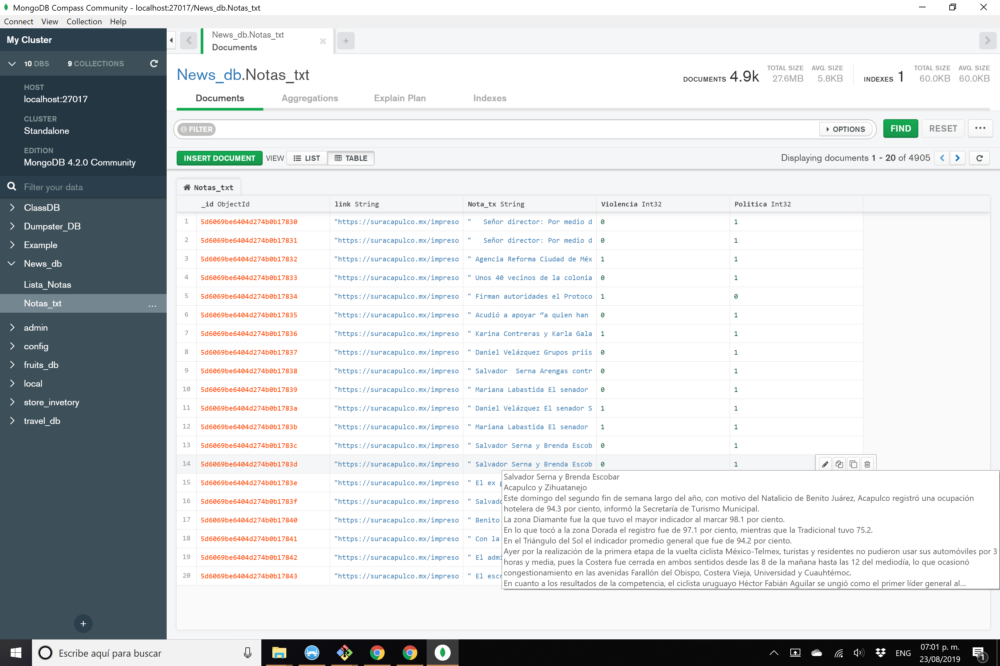